# Project 7: Text Classification with Naive Bayes
#### Seungmin Lee || 50230433
---

## Introduction
---
For this project we will be classifying text using the Naive Bayes Classifier. Similar to the KNN Classifier, we will be working with supervised machine learning where we provide the algorithm with training data as a template for the classification process.

The Naive Bayes Classifier used the Bayes Theorem as a means to calculate the probability of occurrence.

The most general form of the theorem will be the following: 

$$P(A|B) = \frac{P(B|A)*P(A)}{P(B)}$$

$$P(A|B) = Conditional\:Probability\:of\:A\:given\:B$$
$$P(B|A) = Conditional\:Probability\:of\:B\:given\:A$$
$$P(A) = Probability\:of\:event\:A$$
$$P(B) = Probability\:of\:event\:B$$

The files we will be working with can be obtained through the [MTH548 Project 7 Page](https://www.mth548.org/Projects/text_with_naive_bayes/text_with_naive_bayes.html).

- `movie_reviews.zip` is a zipped csv file containing texts of about 25,000 movie reviews. Each review is accompanied by a label, indicating if the review is positive or negative.
- `newsgroups.zip` is a zipped text file with about 7000 posts submitted to eight online newsgroups devoted to different topics: cars, hockey, religion etc. Each post includes information to which newsgroup it was submitted.
- `stopwords.txt` is a text file containing a list of stopwords that will aid in cleaning up texts.

Our objective is to create our own form of the Naive Bayes Classifier and using it to predict if a movie review is positive or negative based on the text of the review and predict which newsgroup a post was submitted based on the text of the post.

In our case, as we will be primarily comparing the probabilities with each other, we can manipulate the equation algebraically into the following:

$$P(A|B)\geq P(B|A)$$
$$P(B|A)*P(A) \geq P(A|B)*P(B)$$

$$P(A|B)\leq P(B|A)$$
$$P(B|A)*P(A) \leq P(A|B)*P(B)$$

## Movie Reviews
---
To start, we will be exploring our options that will allow us to come up with the Naive Bayes Equation that'll be used for classifying the sentiment of the reviews. As our first step, we will be creating a dataframe based off of the csv file extracted from `movie_reviews.zip`.

In [283]:
import pandas as pd

movies = pd.read_csv("movie_reviews.zip")
movies

,review,sentiment
0,"This film is absolutely awful, but nevertheles...",negative
1,Well since seeing part's 1 through 3 I can hon...,negative
2,I got to see this film at a preview and was da...,positive
3,This adaptation positively butchers a classic ...,negative
4,Råzone is an awful movie! It is so simple. It ...,negative
...,...,...
24995,With this movie being the only Dirty Harry mov...,positive
24996,Any screen adaptation of a John Grisham story ...,positive
24997,This film captured my heart from the very begi...,positive
24998,A deplorable social condition triggers off the...,positive


With the dataframe created, in order to continue we must go through the individual reviews and record the number of occurrences of each unique word tied to it being positive or negative.

In [2]:
# Review at index 0 of the dataframe
rev = movies.loc[0, "review"]
print(rev)

This film is absolutely awful, but nevertheless, it can be hilarious at times, although this humor is entirely unintentional.<br /><br />The plot was beyond ridiculous. I don't even think a 2 year-old would be convinced by the ludicrous idiocy that the film-makers tried to slap together into a story. However, on the positive side, some of the horrifically inane plot twists provide a great deal of humor. For example, "Wow, Lady Hogbottom has a giant missile hidden in her back yard!" It gets worse (and even funnier), but I'll spare you.<br /><br />The acting is generally laughable. Most of the kids' roles are sort of cute, but not very believable. On the other hand, Annie is pretty awful all-around. The adults don't take their roles seriously at all, but this is largely a good thing. If they'd tried to be believable, the film would've been even worse. Which is difficult to imagine.<br /><br />Once you get past the overall crappiness of the movie, there are actually a few standout moments

In [3]:
# To clean up some of the text, we will be importing re.
import re

text = movies.loc[0, "review"].lower().replace("<br />", "")
text

'this film is absolutely awful, but nevertheless, it can be hilarious at times, although this humor is entirely unintentional.the plot was beyond ridiculous. i don\'t even think a 2 year-old would be convinced by the ludicrous idiocy that the film-makers tried to slap together into a story. however, on the positive side, some of the horrifically inane plot twists provide a great deal of humor. for example, "wow, lady hogbottom has a giant missile hidden in her back yard!" it gets worse (and even funnier), but i\'ll spare you.the acting is generally laughable. most of the kids\' roles are sort of cute, but not very believable. on the other hand, annie is pretty awful all-around. the adults don\'t take their roles seriously at all, but this is largely a good thing. if they\'d tried to be believable, the film would\'ve been even worse. which is difficult to imagine.once you get past the overall crappiness of the movie, there are actually a few standout moments of almost-not-crappiness. th

In [4]:
# Using re.findall, we can list out all the words used in the review.
words = re.findall(r"[a-z']+", text)
words[:10]

['this',
 'film',
 'is',
 'absolutely',
 'awful',
 'but',
 'nevertheless',
 'it',
 'can',
 'be']

In [6]:
# An alternative to using for loops using re.findall, we can instead import Counter to tally up the occurrences of each word.
from collections import Counter

c1 = Counter(words)
c1

Counter({'this': 4,
         'film': 3,
         'is': 8,
         'absolutely': 1,
         'awful': 2,
         'but': 5,
         'nevertheless': 2,
         'it': 4,
         'can': 1,
         'be': 4,
         'hilarious': 2,
         'at': 2,
         'times': 1,
         'although': 1,
         'humor': 2,
         'entirely': 1,
         'unintentional': 1,
         'the': 20,
         'plot': 2,
         'was': 1,
         'beyond': 1,
         'ridiculous': 1,
         'i': 2,
         "don't": 2,
         'even': 3,
         'think': 1,
         'a': 11,
         'year': 1,
         'old': 1,
         'would': 2,
         'convinced': 1,
         'by': 2,
         'ludicrous': 1,
         'idiocy': 1,
         'that': 3,
         'makers': 1,
         'tried': 2,
         'to': 4,
         'slap': 1,
         'together': 1,
         'into': 1,
         'story': 1,
         'however': 1,
         'on': 3,
         'positive': 1,
         'side': 1,
         'some': 1,
      

In [7]:
c1.most_common()

[('the', 20),
 ('a', 11),
 ('is', 8),
 ('of', 8),
 ('but', 5),
 ('this', 4),
 ('it', 4),
 ('be', 4),
 ('to', 4),
 ('movie', 4),
 ('film', 3),
 ('even', 3),
 ('that', 3),
 ('on', 3),
 ('almost', 3),
 ('awful', 2),
 ('nevertheless', 2),
 ('hilarious', 2),
 ('at', 2),
 ('humor', 2),
 ('plot', 2),
 ('i', 2),
 ("don't", 2),
 ('would', 2),
 ('by', 2),
 ('tried', 2),
 ('lady', 2),
 ('worse', 2),
 ('you', 2),
 ('roles', 2),
 ('are', 2),
 ('not', 2),
 ('very', 2),
 ('believable', 2),
 ('pretty', 2),
 ('all', 2),
 ('good', 2),
 ('get', 2),
 ('crappiness', 2),
 ('there', 2),
 ('actually', 2),
 ('few', 2),
 ('parts', 2),
 ('absolutely', 1),
 ('can', 1),
 ('times', 1),
 ('although', 1),
 ('entirely', 1),
 ('unintentional', 1),
 ('was', 1),
 ('beyond', 1),
 ('ridiculous', 1),
 ('think', 1),
 ('year', 1),
 ('old', 1),
 ('convinced', 1),
 ('ludicrous', 1),
 ('idiocy', 1),
 ('makers', 1),
 ('slap', 1),
 ('together', 1),
 ('into', 1),
 ('story', 1),
 ('however', 1),
 ('positive', 1),
 ('side', 1),
 ('so

In [8]:
sum(c1.values())

276

In [9]:
len(c1)

176

In [10]:
text = movies.loc[1, "review"].lower().replace("<br />", "")
text

"well since seeing part's 1 through 3 i can honestly say that they should have never made part 4. everything from the tacky, and i do mean tacky score to the really bad acting, i dare anyone to watch this and not be bored out of their minds.i mean parts 1 to 3 kept the vibe strong on the plot of damion, but without him around in this one it's just not the same. sure by the end of part 3 i was getting a little tired of the continued story line's, but it was a good closure at the end of the third one. again there was no reason for a part 4. even if there was they could have done a much better job than this sh*t i had to sit through, lol. there goes an hour and a half of my life i'll never see again."

In [11]:
words = re.findall(r"[a-z']+", text)
words

['well',
 'since',
 'seeing',
 "part's",
 'through',
 'i',
 'can',
 'honestly',
 'say',
 'that',
 'they',
 'should',
 'have',
 'never',
 'made',
 'part',
 'everything',
 'from',
 'the',
 'tacky',
 'and',
 'i',
 'do',
 'mean',
 'tacky',
 'score',
 'to',
 'the',
 'really',
 'bad',
 'acting',
 'i',
 'dare',
 'anyone',
 'to',
 'watch',
 'this',
 'and',
 'not',
 'be',
 'bored',
 'out',
 'of',
 'their',
 'minds',
 'i',
 'mean',
 'parts',
 'to',
 'kept',
 'the',
 'vibe',
 'strong',
 'on',
 'the',
 'plot',
 'of',
 'damion',
 'but',
 'without',
 'him',
 'around',
 'in',
 'this',
 'one',
 "it's",
 'just',
 'not',
 'the',
 'same',
 'sure',
 'by',
 'the',
 'end',
 'of',
 'part',
 'i',
 'was',
 'getting',
 'a',
 'little',
 'tired',
 'of',
 'the',
 'continued',
 'story',
 "line's",
 'but',
 'it',
 'was',
 'a',
 'good',
 'closure',
 'at',
 'the',
 'end',
 'of',
 'the',
 'third',
 'one',
 'again',
 'there',
 'was',
 'no',
 'reason',
 'for',
 'a',
 'part',
 'even',
 'if',
 'there',
 'was',
 'they',
 'c

In [12]:
c2 = Counter(words)
c2

Counter({'well': 1,
         'since': 1,
         'seeing': 1,
         "part's": 1,
         'through': 2,
         'i': 6,
         'can': 1,
         'honestly': 1,
         'say': 1,
         'that': 1,
         'they': 2,
         'should': 1,
         'have': 2,
         'never': 2,
         'made': 1,
         'part': 3,
         'everything': 1,
         'from': 1,
         'the': 9,
         'tacky': 2,
         'and': 3,
         'do': 1,
         'mean': 2,
         'score': 1,
         'to': 4,
         'really': 1,
         'bad': 1,
         'acting': 1,
         'dare': 1,
         'anyone': 1,
         'watch': 1,
         'this': 3,
         'not': 2,
         'be': 1,
         'bored': 1,
         'out': 1,
         'of': 6,
         'their': 1,
         'minds': 1,
         'parts': 1,
         'kept': 1,
         'vibe': 1,
         'strong': 1,
         'on': 1,
         'plot': 1,
         'damion': 1,
         'but': 2,
         'without': 1,
         'him': 1,
 

In [13]:
# With the 2 Counters, it's possible to combine them like the following
c1 + c2

Counter({'this': 7,
         'film': 3,
         'is': 8,
         'absolutely': 1,
         'awful': 2,
         'but': 7,
         'nevertheless': 2,
         'it': 5,
         'can': 2,
         'be': 5,
         'hilarious': 2,
         'at': 3,
         'times': 1,
         'although': 1,
         'humor': 2,
         'entirely': 1,
         'unintentional': 1,
         'the': 29,
         'plot': 3,
         'was': 5,
         'beyond': 1,
         'ridiculous': 1,
         'i': 8,
         "don't": 2,
         'even': 4,
         'think': 1,
         'a': 16,
         'year': 1,
         'old': 1,
         'would': 2,
         'convinced': 1,
         'by': 3,
         'ludicrous': 1,
         'idiocy': 1,
         'that': 4,
         'makers': 1,
         'tried': 2,
         'to': 8,
         'slap': 1,
         'together': 1,
         'into': 1,
         'story': 2,
         'however': 1,
         'on': 4,
         'positive': 1,
         'side': 1,
         'some': 1,
      

Now that we have a method of associating every unique word used in the review with the number of occurrence, we can form our testing and training data.

In [284]:
train_frac = 0.5
train_df = movies.sample(frac=train_frac, random_state=0).copy()
train_df

,review,sentiment
14149,This whole film should have lasted 45 minutes ...,negative
8946,"This little film had long been on my ""keeper"" ...",positive
22378,This movie makes me want to fall in love all o...,positive
12162,How I got into it: When I started watching thi...,positive
4879,"Normally, I have no problem with a movie or st...",negative
...,...,...
7117,I think this is probably one of the worst movi...,negative
2944,"since this is part 2, then compering it to par...",negative
14868,The movie was not a waste except for some bori...,negative
2999,The opening shot was the best thing about this...,negative


In [285]:
test_df = movies.drop(train_df.index).copy()
test_df

,review,sentiment
0,"This film is absolutely awful, but nevertheles...",negative
2,I got to see this film at a preview and was da...,positive
3,This adaptation positively butchers a classic ...,negative
5,"Firstly, this is simply the funniest movie I h...",positive
10,Eddie Murphy Delirious is by far the funniest ...,positive
...,...,...
24988,I was curious to watch this movie. A lot of pe...,negative
24990,For years Madonna has tried to prove not only ...,negative
24991,This film is justly famous as one of the most ...,negative
24993,"This Movie was amazing, it is the kind of movi...",positive


In [16]:
# We will be creating a function that will serve the same process as it will aid in the calculation portion later.
def wc(text):
    words = re.findall("[a-z']+", text.lower().replace("<br />", ""))
    return Counter(words)

In [17]:
train_df.loc[14149, "review"]

'This whole film should have lasted 45 minutes - maximum. Although an interesting concept/theme, it really did not develop as a story. Once the initial idea of a brave (stupid?) bomb disposal expert (cowboy?) are introduced, and this happens very early in the film, the rest is repetitious. Characters were not explored, and aspects of the location and politics were ignored. There was some nice insight into the appalling difficulties faced by troops in such a foreign environment, and the difficulties in differentiating between friend and foe. But the way in which the unit operated stretched belief! Individual performances were good, and special effects were adequate, but not enough to overcome the basic lack of content.'

In [18]:
wc(train_df.loc[14149, "review"])

Counter({'this': 2,
         'whole': 1,
         'film': 2,
         'should': 1,
         'have': 1,
         'lasted': 1,
         'minutes': 1,
         'maximum': 1,
         'although': 1,
         'an': 1,
         'interesting': 1,
         'concept': 1,
         'theme': 1,
         'it': 1,
         'really': 1,
         'did': 1,
         'not': 3,
         'develop': 1,
         'as': 1,
         'a': 3,
         'story': 1,
         'once': 1,
         'the': 9,
         'initial': 1,
         'idea': 1,
         'of': 3,
         'brave': 1,
         'stupid': 1,
         'bomb': 1,
         'disposal': 1,
         'expert': 1,
         'cowboy': 1,
         'are': 1,
         'introduced': 1,
         'and': 6,
         'happens': 1,
         'very': 1,
         'early': 1,
         'in': 4,
         'rest': 1,
         'is': 1,
         'repetitious': 1,
         'characters': 1,
         'were': 4,
         'explored': 1,
         'aspects': 1,
         'location': 1,


In [286]:
# Using the wc function, we can implement it into our dataframe and add a column containing the word counts.
train_df["word_counts"] = train_df["review"].map(wc)
train_df

,review,sentiment,word_counts
14149,This whole film should have lasted 45 minutes ...,negative,"{'this': 2, 'whole': 1, 'film': 2, 'should': 1..."
8946,"This little film had long been on my ""keeper"" ...",positive,"{'this': 3, 'little': 1, 'film': 1, 'had': 1, ..."
22378,This movie makes me want to fall in love all o...,positive,"{'this': 1, 'movie': 1, 'makes': 1, 'me': 2, '..."
12162,How I got into it: When I started watching thi...,positive,"{'how': 1, 'i': 7, 'got': 1, 'into': 1, 'it': ..."
4879,"Normally, I have no problem with a movie or st...",negative,"{'normally': 1, 'i': 5, 'have': 2, 'no': 1, 'p..."
...,...,...,...
7117,I think this is probably one of the worst movi...,negative,"{'i': 6, 'think': 1, 'this': 5, 'is': 2, 'prob..."
2944,"since this is part 2, then compering it to par...",negative,"{'since': 1, 'this': 1, 'is': 1, 'part': 2, 't..."
14868,The movie was not a waste except for some bori...,negative,"{'the': 11, 'movie': 3, 'was': 4, 'not': 3, 'a..."
2999,The opening shot was the best thing about this...,negative,"{'the': 11, 'opening': 2, 'shot': 2, 'was': 4,..."


In [287]:
# It's also possible to manipulate our dataframe to associate the occurrences of words to a positive or negative review.
# We can apply the same concept of concatenating the word counts in a dataframe.
counters = {}
for label in train_df["sentiment"].unique():
    counters[label] = Counter()

for i in train_df.index:
    counters[train_df.loc[i, "sentiment"]] += train_df.loc[i, "word_counts"]
    
word_counts = pd.DataFrame(counters)
word_counts

,negative,positive
this,20447.0,17393.0
whole,897.0,661.0
film,9373.0,10162.0
should,1468.0,1078.0
have,7527.0,6389.0
...,...,...
subsection,NaN,1.0
matkondar,NaN,1.0
bhajpai,NaN,1.0
brightens,NaN,1.0


In [288]:
# As there are instances where a word never occurred for a type of review, we need to fill in the null values with zeroes.
word_counts = word_counts.fillna(0)
word_counts

,negative,positive
this,20447.0,17393.0
whole,897.0,661.0
film,9373.0,10162.0
should,1468.0,1078.0
have,7527.0,6389.0
...,...,...
subsection,0.0,1.0
matkondar,0.0,1.0
bhajpai,0.0,1.0
brightens,0.0,1.0


In [289]:
word_counts.sort_values(by="negative", ascending=False)

,negative,positive
the,81667.0,86677.0
a,39887.0,41830.0
and,37181.0,44864.0
of,34722.0,38552.0
to,34216.0,33379.0
...,...,...
greenness,0.0,1.0
latvia's,0.0,1.0
interlinking,0.0,1.0
sachar's,0.0,1.0


When viewing the most frequent words used, we can see that there are several words that have no correlation to a positive or negative review. Words such as "the", "a", "and", "of", and many more hold no significant meaning behind them. To correctly use this data for the classification process, we will need to filter out words such as these.

In [25]:
# We will use the words from stopwords.txt to filter out unnecessary words.
with open("stopwords.txt") as foo:
    stops = foo.read().split(",")
print(stops)

['a', 'able', 'about', 'across', 'after', 'all', 'almost', 'also', 'am', 'among', 'an', 'and', 'any', 'are', 'as', 'at', 'be', 'because', 'been', 'but', 'by', 'can', 'cannot', 'could', 'dear', 'did', 'do', 'does', 'either', 'else', 'ever', 'every', 'for', 'from', 'get', 'got', 'had', 'has', 'have', 'he', 'her', 'hers', 'him', 'his', 'how', 'however', 'i', 'if', 'in', 'into', 'is', 'it', 'its', 'just', 'least', 'let', 'like', 'likely', 'may', 'me', 'might', 'most', 'must', 'my', 'neither', 'no', 'nor', 'not', 'of', 'off', 'often', 'on', 'only', 'or', 'other', 'our', 'own', 'rather', 'said', 'say', 'says', 'she', 'should', 'since', 'so', 'some', 'than', 'that', 'the', 'their', 'them', 'then', 'there', 'these', 'they', 'this', 'tis', 'to', 'too', 'twas', 'us', 'wants', 'was', 'we', 'were', 'what', 'when', 'where', 'which', 'while', 'who', 'whom', 'why', 'will', 'with', 'would', 'yet', 'you', 'your']


In [26]:
word_counts = word_counts.drop(stops, errors="ignore")

In [27]:
# In the case where we have a probability of zero when calculating the Naive Bayes Theorem, we need to compensate the data 
# to ensure that none of the values will be severely impacted. Simply changing the zeroes with ones will forcibly alter our
# data so rather than that we will be using Laplace Smoothing to compensate for this.
word_counts = word_counts + 1
word_counts

,negative,positive
whole,898.0,662.0
film,9374.0,10163.0
lasted,33.0,25.0
minutes,1109.0,421.0
maximum,13.0,10.0
...,...,...
subsection,1.0,2.0
matkondar,1.0,2.0
bhajpai,1.0,2.0
brightens,1.0,2.0


We will now create a function `word_prob` that'll serve as the variable for $P(A|B)$ for the Naive Bayes Theorem.

In [28]:
def word_prob(w):
    # Number of occurrences for word / Total number of words used
    return word_counts.loc[w]/word_counts.sum()

In [29]:
word_prob("fantastic")

negative    0.000093
positive    0.000385
dtype: float64

In [30]:
word_prob("terrible")

negative    0.000843
positive    0.000143
dtype: float64

In [31]:
# Example of when using the word_prob function with text rather than a single string
review = "This movie was not what I expected. I'm disappointed!"

words = re.findall(r"[a-z']+", review.lower())
words

['this', 'movie', 'was', 'not', 'what', 'i', 'expected', "i'm", 'disappointed']

In [33]:
# We will be using the math library to calculate the product of all the values (probabilities) in the list.
from math import prod

probs = prod([word_prob(w) for w in words if w in word_counts.index])
probs

negative    2.036766e-12
positive    4.714734e-13
dtype: float64

In [34]:
# class_probs is the probability of a review being negative or positive
class_probs = train_df["sentiment"].value_counts()/len(train_df)
class_probs

negative    0.50264
positive    0.49736
Name: sentiment, dtype: float64

In [35]:
# Calculating the products of the two will complete the Naive Bayes Theorem
probs = prod([word_prob(w) for w in words if w in word_counts.index])*class_probs
probs

negative    1.023760e-12
positive    2.344920e-13
dtype: float64

In [36]:
N = 1520
long_review = test_df.iloc[N]["review"]
long_review

'Wow... what... a whirlwind. The 30\'s is a decade with plenty of movies of every type I can imagine, especially during the early talkies phase. There were movies which are painfully static and dull, like "Dracula" with Bella Lugosi, and there were those that just don\'t give it a rest, sometimes in a good way and other times not. This is one of the films that don\'t stop for a minute, and that is both a wonder and a pity. Lloyd Bacon, who also directed "42nd Street", must have been the king of the Depression Era musicals and he was probably excited with the possibilities sound brought to the world of cinema, for he filled this picture with it. There mustn\'t be a full minute or two without music or someone speaking. It\'s completely crazy! I was thinking the movie deserved a 5 (or a 6, tops) because the pacing was very poor, since it was insanely fast and I sometimes didn\'t know what was happening and what to think. The characters seemed to just running to and fro places, talking abo

In [37]:
test_df.iloc[N]["sentiment"]

'positive'

In [39]:
# The issue we run into when calculating the probability based on product is that there are instances where the value 
# calculated is too small for the machine to register. As a result, the number 0 will be outputed rather than a number in
# scientific notation.
words = re.findall(r"[a-z']+", long_review.lower())
probs = prod([word_prob(w) for w in words if w in word_counts.index])*class_probs
probs

negative    0.0
positive    0.0
dtype: float64

In [41]:
# In order to compensate for the misinterpretted output, we can use log instead. 
import numpy as np
words = re.findall(r"[a-z']+", long_review.lower())
log_probs = sum([np.log10(word_prob(w)) for w in words if w in word_counts.index]) + np.log10(class_probs)
log_probs

negative   -577.132589
positive   -575.681909
dtype: float64

In [42]:
log_probs.idxmax() # Picks the largest value out of the two

'positive'

In [43]:
# movie_pred is the completed function that implements all of the components that were previously went over
def movie_pred(text):
    words = re.findall(r"[a-z']+", text.lower())
    log_probs = sum([np.log10(word_prob(w)) for w in words if w in word_counts.index]) + np.log10(class_probs)
    return log_probs.idxmax()

In [44]:
movie_pred(long_review)

'positive'

In [55]:
N = 5234
long_review1 = test_df.iloc[N]["review"]
print("Test Label: " + test_df.iloc[N]["sentiment"])
print("Predictor Label: " + movie_pred(long_review1))

Test Label: negative
Predictor Label: negative


In [56]:
N = 7234
long_review2 = test_df.iloc[N]["review"]
print("Test Label: " + test_df.iloc[N]["sentiment"])
print("Predictor Label: " + movie_pred(long_review2))

Test Label: positive
Predictor Label: positive


To visually represent the accuracy of the created Naive Bayes Classifier, we will be creating a Confusion Matrix that will illustrate the amount of times the classifier predicted correctly compared to the label of the testing set.

In [64]:
labels = np.asarray([test_df.iloc[n]["sentiment"] for n in range(1000,1251)])
predictions = np.asarray([movie_pred(test_df.iloc[n]["review"]) for n in range(1000,1251)])
ctab = pd.crosstab(labels, predictions)

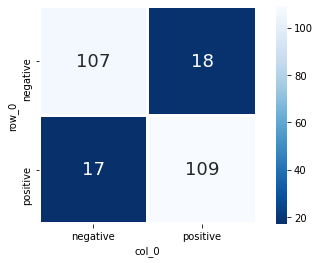

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 4))
sns.heatmap(ctab, 
            cmap="Blues_r", 
            annot=True, 
            annot_kws = {"fontsize": 18},
            linewidth=2,
            square = True,
            fmt="d"
           );

Through a test of 251 different reviews, our prediction accuracy isn't perfect but moderately accurate. Out of 125 negative reviews, 107 out of 125 (85.6%) were correctly predicted to be negative, with 18 out of 125 (14.4%) being incorrectly predicted. As for the positive reviews, 109 out of 126 (86.5%) were correctly predicted to be positive while 17 out of 126 (13.5%) were mistakenly determined to be negative.

## Ratings of Newsgroups
---
For the classification of newsgroup articles, we will be using what we already have for movies and alter a few variables to suit the data we're working with.

Compared to the data for movie reviews where there were positive and negative reviews, we will be working with 8 different classifications for news posts: religion, cars, hockey, *etc*.

In [280]:
# Example
sample = """Newsgroup: rec.autos
From: gwm@spl1.spl.loral.com (Gary W. Mahan)
Subject: Re: Are BMW's worth the price?            


>sure sounds like they got a ringer.  the 325is i drove was definitely
>faster than that.  if you want to quote numbers, my AW AutoFile shows
>0-60 in 7.4, 1/4 mile in 15.9.  it quotes Car and Driver's figures
>of 6.9 and 15.3.  oh, BTW, these numbers are for the 325i.

Car and Driver rated the 325is (1988) at 7.2 0-60 , 1/4 at 15.2 (after 30k miles) last time I checked 8#}.

Automobile magazine rated new 325is 1/4 mile@16.2.

Gee , aint quotiin funner than the dickens!

Sounds like we need a race.  I'll let you have the newer version.  Can someone out there lend me a 1988 325is for a day 8-].  I wont hurt it, I promise.

>i don't know how the addition of variable valve timing for 1993 affects it.
>but don't take my word for it.  go drive it.

Actually I will take your word on it.  I refuse to test it (new 325is) because
I love BMW's and would probably want to buy it.  Problem is, my income just doesn't support that.  

"""

In [68]:
print(sample)

Newsgroup: rec.autos
From: gwm@spl1.spl.loral.com (Gary W. Mahan)
Subject: Re: Are BMW's worth the price?            


>sure sounds like they got a ringer.  the 325is i drove was definitely
>faster than that.  if you want to quote numbers, my AW AutoFile shows
>0-60 in 7.4, 1/4 mile in 15.9.  it quotes Car and Driver's figures
>of 6.9 and 15.3.  oh, BTW, these numbers are for the 325i.

Car and Driver rated the 325is (1988) at 7.2 0-60 , 1/4 at 15.2 (after 30k miles) last time I checked 8#}.

Automobile magazine rated new 325is 1/4 mile@16.2.

Gee , aint quotiin funner than the dickens!

Sounds like we need a race.  I'll let you have the newer version.  Can someone out there lend me a 1988 325is for a day 8-].  I wont hurt it, I promise.

>i don't know how the addition of variable valve timing for 1993 affects it.
>but don't take my word for it.  go drive it.

Actually I will take your word on it.  I refuse to test it (new 325is) because
I love BMW's and would probably want to buy it.

In [79]:
test1 = re.findall(r"^.*Newsgroup:.*$", sample, flags=re.M)
test1

['Newsgroup: rec.autos']

In [82]:
re.sub("Newsgroup: ", "",test1[0])

'rec.autos'

In [178]:
# Since we are working with a text file rather than a csv file, we will change our initial approach in retrieving our data 
# using the zipfile library.
import zipfile as zip
with zip.ZipFile("newsgroups.zip") as zf:
    with zf.open("newsgroups.txt") as f:
        newsgroups = f.read()
newsgroups

b'Newsgroup: rec.autos\nFrom: gwm@spl1.spl.loral.com (Gary W. Mahan)\nSubject: Re: Are BMW\'s worth the price?            \n\n\n>sure sounds like they got a ringer.  the 325is i drove was definitely\n>faster than that.  if you want to quote numbers, my AW AutoFile shows\n>0-60 in 7.4, 1/4 mile in 15.9.  it quotes Car and Driver\'s figures\n>of 6.9 and 15.3.  oh, BTW, these numbers are for the 325i.\n\nCar and Driver rated the 325is (1988) at 7.2 0-60 , 1/4 at 15.2 (after 30k miles) last time I checked 8#}.\n\nAutomobile magazine rated new 325is 1/4 mile@16.2.\n\nGee , aint quotiin funner than the dickens!\n\nSounds like we need a race.  I\'ll let you have the newer version.  Can someone out there lend me a 1988 325is for a day 8-].  I wont hurt it, I promise.\n\n>i don\'t know how the addition of variable valve timing for 1993 affects it.\n>but don\'t take my word for it.  go drive it.\n\nActually I will take your word on it.  I refuse to test it (new 325is) because\nI love BMW\'s and 

In [255]:
news = newsgroups.decode("utf-8") # Changes bytes to string

In [256]:
# This creates a lists corresponding to their relative index for the topic covered in the newsgroup posts.
# Note: category will be further filtered to correctly and accurately specify which topic is being covered
category = re.findall(r"^.*Newsgroup:.*$", news, flags=re.M)
category

['Newsgroup: rec.autos',
 'Newsgroup: sci.med',
 'Newsgroup: alt.atheism',
 'Newsgroup: rec.sport.baseball',
 'Newsgroup: talk.religion.misc',
 'Newsgroup: rec.sport.hockey',
 'Newsgroup: sci.med',
 'Newsgroup: rec.sport.baseball',
 'Newsgroup: sci.electronics',
 'Newsgroup: rec.sport.hockey',
 'Newsgroup: sci.med',
 'Newsgroup: rec.sport.hockey',
 'Newsgroup: sci.med',
 'Newsgroup: rec.autos',
 'Newsgroup: sci.med',
 'Newsgroup: alt.atheism',
 'Newsgroup: rec.sport.hockey',
 'Newsgroup: talk.religion.misc',
 'Newsgroup: sci.med',
 'Newsgroup: sci.med',
 'Newsgroup: sci.electronics',
 'Newsgroup: rec.sport.hockey',
 'Newsgroup: rec.autos',
 'Newsgroup: sci.med',
 'Newsgroup: rec.sport.baseball',
 'Newsgroup: sci.electronics',
 'Newsgroup: sci.med',
 'Newsgroup: rec.motorcycles',
 'Newsgroup: rec.autos',
 'Newsgroup: rec.sport.baseball',
 'Newsgroup: rec.sport.baseball',
 'Newsgroup: rec.autos',
 'Newsgroup: alt.atheism',
 'Newsgroup: sci.med',
 'Newsgroup: sci.electronics',
 'Newsgroup

In [257]:
news = news.replace("\n", " ").split("Newsgroup: ") # Cleaning up some unnecessary characters but will be further filtered
del news[0]
news

["rec.autos From: gwm@spl1.spl.loral.com (Gary W. Mahan) Subject: Re: Are BMW's worth the price?               >sure sounds like they got a ringer.  the 325is i drove was definitely >faster than that.  if you want to quote numbers, my AW AutoFile shows >0-60 in 7.4, 1/4 mile in 15.9.  it quotes Car and Driver's figures >of 6.9 and 15.3.  oh, BTW, these numbers are for the 325i.  Car and Driver rated the 325is (1988) at 7.2 0-60 , 1/4 at 15.2 (after 30k miles) last time I checked 8#}.  Automobile magazine rated new 325is 1/4 mile@16.2.  Gee , aint quotiin funner than the dickens!  Sounds like we need a race.  I'll let you have the newer version.  Can someone out there lend me a 1988 325is for a day 8-].  I wont hurt it, I promise.  >i don't know how the addition of variable valve timing for 1993 affects it. >but don't take my word for it.  go drive it.  Actually I will take your word on it.  I refuse to test it (new 325is) because I love BMW's and would probably want to buy it.  Problem

In [258]:
# In order to create a dataframe for the newsgroup posts, we need to alter our data to fit into the parameters for the
# dataframe. While doing so we will further adjust our data to better represent what category each post belongs to along with
# removing a few strings that would negatively impact our calculations for the prediction (newsgroup tag).
news1 = []
for index, element in enumerate(category):
    temp = element.replace("Newsgroup: ", "")
    news[index] = news[index].replace(temp, "")
    topic = temp.split(".")
    if topic[1] == "autos":
        topic = "cars"
    elif topic[1] == "sport":
        topic = topic[2]
    else:
        topic = topic[1]
    news1.append([news[index], topic])

In [259]:
news1

[[" From: gwm@spl1.spl.loral.com (Gary W. Mahan) Subject: Re: Are BMW's worth the price?               >sure sounds like they got a ringer.  the 325is i drove was definitely >faster than that.  if you want to quote numbers, my AW AutoFile shows >0-60 in 7.4, 1/4 mile in 15.9.  it quotes Car and Driver's figures >of 6.9 and 15.3.  oh, BTW, these numbers are for the 325i.  Car and Driver rated the 325is (1988) at 7.2 0-60 , 1/4 at 15.2 (after 30k miles) last time I checked 8#}.  Automobile magazine rated new 325is 1/4 mile@16.2.  Gee , aint quotiin funner than the dickens!  Sounds like we need a race.  I'll let you have the newer version.  Can someone out there lend me a 1988 325is for a day 8-].  I wont hurt it, I promise.  >i don't know how the addition of variable valve timing for 1993 affects it. >but don't take my word for it.  go drive it.  Actually I will take your word on it.  I refuse to test it (new 325is) because I love BMW's and would probably want to buy it.  Problem is, my 

In [260]:
newsdf = pd.DataFrame(np.array(news1), columns = ["post", "topic"])
newsdf

,post,topic
0,From: gwm@spl1.spl.loral.com (Gary W. Mahan) ...,cars
1,From: davec@ecst.csuchico.edu (Dave Childs) S...,med
2,"From: ""Robert Knowles"" <p00261@psilink.com> S...",atheism
3,From: sepinwal@mail.sas.upenn.edu (Alan Sepin...,baseball
4,From: rwd4f@poe.acc.Virginia.EDU (Rob Dobson)...,religion
...,...,...
7373,From: ron.roth@rose.com (ron roth) Subject: S...,med
7374,From: RZAA80@email.sps.mot.com (Jim Chott) Su...,cars
7375,"From: ""James J. Murawski"" <jjm+@andrew.cmu.ed...",hockey
7376,From: au021@cleveland.Freenet.Edu (Roland Beh...,hockey


With the dataframe created for the newsgroup posts, we can split the existing dataframe into two, our training data and our testing data.

In [261]:
Ntrain_df = newsdf.sample(frac=train_frac, random_state=0).copy()
Ntrain_df

,post,topic
1940,From: balick@nynexst.com (Daphne Balick) Subj...,med
4532,From: Martin D. Hill <32GFKKH@CMUVM.CSV.CMICH...,hockey
3774,From: edw@boi.hp.com (Edward Walsh) Subject: ...,motorcycles
4154,From: rwf2@ns1.cc.lehigh.edu (ROBERT WILLIAM ...,motorcycles
5204,From: klassen@sol.UVic.CA (Melvin Klassen) Su...,baseball
...,...,...
2491,From: Tom Wetzel <twetzel@ucs.indiana.edu> Su...,cars
2859,From: keith@cco.caltech.edu (Keith Allan Schn...,atheism
4595,From: kmr4@po.CWRU.edu (Keith M. Ryan) Subjec...,atheism
4346,"From: dps@nasa.kodak.com (Dan Schaertel,,,) S...",atheism


In [262]:
Ntest_df = newsdf.drop(Ntrain_df.index).copy()
Ntest_df

,post,topic
0,From: gwm@spl1.spl.loral.com (Gary W. Mahan) ...,cars
2,"From: ""Robert Knowles"" <p00261@psilink.com> S...",atheism
3,From: sepinwal@mail.sas.upenn.edu (Alan Sepin...,baseball
5,From: umturne4@ccu.umanitoba.ca (Daryl Turner...,hockey
7,From: rickc@krill.corp.sgi.com (Richard Casar...,baseball
...,...,...
7366,From: <RVESTERM@vma.cc.nd.edu> Subject: Re: J...,baseball
7367,From: alan.barclay@almac.co.uk (Alan Barclay)...,med
7369,From: jchen@wind.bellcore.com (Jason Chen) Su...,med
7372,From: randy@ve6bc.ampr.ab.ca (Randy J. Pointk...,electronics


In [264]:
# Similar to what we applied for movies, we will create a word count column. Everything that comes afterwards will
# following the same process.
Ntrain_df["word_counts"] = Ntrain_df["post"].map(wc)
Ntrain_df

,post,topic,word_counts
1940,From: balick@nynexst.com (Daphne Balick) Subj...,med,"{'from': 3, 'balick': 2, 'nynexst': 1, 'com': ..."
4532,From: Martin D. Hill <32GFKKH@CMUVM.CSV.CMICH...,hockey,"{'from': 3, 'martin': 2, 'd': 1, 'hill': 2, 'g..."
3774,From: edw@boi.hp.com (Edward Walsh) Subject: ...,motorcycles,"{'from': 3, 'edw': 3, 'boi': 3, 'hp': 3, 'com'..."
4154,From: rwf2@ns1.cc.lehigh.edu (ROBERT WILLIAM ...,motorcycles,"{'from': 1, 'rwf': 1, 'ns': 1, 'cc': 1, 'lehig..."
5204,From: klassen@sol.UVic.CA (Melvin Klassen) Su...,baseball,"{'from': 1, 'klassen': 2, 'sol': 1, 'uvic': 1,..."
...,...,...,...
2491,From: Tom Wetzel <twetzel@ucs.indiana.edu> Su...,cars,"{'from': 2, 'tom': 2, 'wetzel': 1, 'twetzel': ..."
2859,From: keith@cco.caltech.edu (Keith Allan Schn...,atheism,"{'from': 1, 'keith': 4, 'cco': 1, 'caltech': 1..."
4595,From: kmr4@po.CWRU.edu (Keith M. Ryan) Subjec...,atheism,"{'from': 1, 'kmr': 1, 'po': 1, 'cwru': 1, 'edu..."
4346,"From: dps@nasa.kodak.com (Dan Schaertel,,,) S...",atheism,"{'from': 1, 'dps': 1, 'nasa': 1, 'kodak': 1, '..."


In [267]:
ncounters = {}
for label in Ntrain_df["topic"].unique():
    ncounters[label] = Counter()

for i in Ntrain_df.index:
    ncounters[Ntrain_df.loc[i, "topic"]] += Ntrain_df.loc[i, "word_counts"]
    
nword_counts = pd.DataFrame(ncounters)
nword_counts

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
from,1001.0,862.0,755.0,746.0,792.0,762.0,799.0,877.0
balick,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nynexst,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
com,472.0,214.0,718.0,398.0,341.0,606.0,383.0,419.0
daphne,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
hangings,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
squads,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
eagel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
hypnotized,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [270]:
nword_counts = nword_counts.fillna(0).drop(stops, errors="ignore") + 1 # Filling in the null values and accommodate Laplace
nword_counts

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
balick,3.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
nynexst,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0
daphne,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
...,...,...,...,...,...,...,...,...
hangings,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0
squads,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0
eagel,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0
hypnotized,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0


In [272]:
nclass_probs = Ntrain_df["topic"].value_counts()/len(Ntrain_df) 
nclass_probs

motorcycles    0.141231
baseball       0.135538
cars           0.132827
electronics    0.131472
med            0.130388
hockey         0.127135
atheism        0.114394
religion       0.087015
Name: topic, dtype: float64

In [271]:
def nword_prob(w):
    return nword_counts.loc[w]/nword_counts.sum() # Only thing that changed are the dataframes we are pulling the variables from

In [273]:
def news_pred(text):
    words = re.findall(r"[a-z']+", text.lower())
    log_probs = sum([np.log10(nword_prob(w)) for w in words if w in nword_counts.index]) + np.log10(nclass_probs)
    return log_probs.idxmax()

In [275]:
N = 5
long_review0 = Ntest_df.iloc[N]["post"]
print("Test Label: " + Ntest_df.iloc[N]["topic"])
print("Predictor Label: " + news_pred(long_review0))

Test Label: med
Predictor Label: med


In [276]:
N = 125
long_review1 = Ntest_df.iloc[N]["post"]
print("Test Label: " + Ntest_df.iloc[N]["topic"])
print("Predictor Label: " + news_pred(long_review1))

Test Label: hockey
Predictor Label: hockey


In [277]:
N = 436
long_review2 = Ntest_df.iloc[N]["post"]
print("Test Label: " + Ntest_df.iloc[N]["topic"])
print("Predictor Label: " + news_pred(long_review2))

Test Label: religion
Predictor Label: atheism


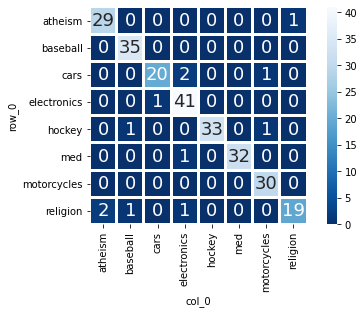

In [279]:
# As we did before, we will also visually portray the accuracy of the create Naive Bayes Classifier
labels = np.asarray([Ntest_df.iloc[n]["topic"] for n in range(1000,1251)])
predictions = np.asarray([news_pred(Ntest_df.iloc[n]["post"]) for n in range(1000,1251)])
ctab = pd.crosstab(labels, predictions)

plt.figure(figsize=(7, 4))
sns.heatmap(ctab, 
            cmap="Blues_r", 
            annot=True, 
            annot_kws = {"fontsize": 18},
            linewidth=2,
            square = True,
            fmt="d"
           );

Compared to the predictions for movie reviews, the predictions for the newsgroup posts were more accurately determined. A possible explanation to this would be the fact that each separate category of posts could contain key words that are relative to that genre.

In [294]:
nword_counts.sort_values(by="med", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0
one,447.0,281.0,284.0,310.0,350.0,279.0,357.0,558.0
re,366.0,343.0,466.0,403.0,313.0,417.0,274.0,483.0


In [295]:
nword_counts.sort_values(by="hockey", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
game,2.0,604.0,7.0,349.0,14.0,3.0,12.0,23.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
hockey,1.0,477.0,1.0,4.0,1.0,1.0,1.0,2.0
team,4.0,466.0,7.0,283.0,1.0,2.0,7.0,1.0


In [296]:
nword_counts.sort_values(by="motorcycles", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
re,366.0,343.0,466.0,403.0,313.0,417.0,274.0,483.0
writes,347.0,323.0,456.0,422.0,276.0,357.0,327.0,464.0


In [297]:
nword_counts.sort_values(by="baseball", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
writes,347.0,323.0,456.0,422.0,276.0,357.0,327.0,464.0
re,366.0,343.0,466.0,403.0,313.0,417.0,274.0,483.0
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0


In [298]:
nword_counts.sort_values(by="electronics", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
one,447.0,281.0,284.0,310.0,350.0,279.0,357.0,558.0
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0
re,366.0,343.0,466.0,403.0,313.0,417.0,274.0,483.0


In [299]:
nword_counts.sort_values(by="cars", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
car,4.0,5.0,104.0,5.0,54.0,669.0,11.0,11.0
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0
subject,506.0,489.0,524.0,505.0,549.0,505.0,335.0,436.0
re,366.0,343.0,466.0,403.0,313.0,417.0,274.0,483.0


In [300]:
nword_counts.sort_values(by="religion", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
com,473.0,215.0,719.0,399.0,342.0,607.0,384.0,420.0
god,23.0,13.0,31.0,14.0,5.0,5.0,365.0,544.0
one,447.0,281.0,284.0,310.0,350.0,279.0,357.0,558.0
jesus,2.0,11.0,2.0,2.0,1.0,1.0,341.0,94.0


In [301]:
nword_counts.sort_values(by="atheism", ascending=False).head(5)

,med,hockey,motorcycles,baseball,electronics,cars,religion,atheism
edu,855.0,763.0,554.0,1032.0,595.0,641.0,521.0,851.0
one,447.0,281.0,284.0,310.0,350.0,279.0,357.0,558.0
god,23.0,13.0,31.0,14.0,5.0,5.0,365.0,544.0
re,366.0,343.0,466.0,403.0,313.0,417.0,274.0,483.0
writes,347.0,323.0,456.0,422.0,276.0,357.0,327.0,464.0


When comparing each of the top five results pertaining to a certain category, we can see that there are instances where specific words occur more frequently. An example of this would be the amount of times the word "game" appears when concerning sports, the word "car being used when taking about cars, or the word "jesus" being more frequent for religious posts. These kinds of words hold a certain weight depending on the various categories. When it comes to movie reviews, there are cases where words that could potentially hold a negative meaning wouldn't ultimately result in a negative review. The training data used for the movie review classifier can't consistently and accurately distinguish the weight and emotion held in every word. However, if it comes to topics discussed, theres a higher probability of a word directly relating to a certain category. As a result, when comparing the confusion matrices of both movie reviews and newsgroup posts it came out to be that the predictions for newsgroup posts were significantly more accurate.

## Further Analyisis
---

In [303]:
N = 5230
long_review1 = test_df.iloc[N]["review"]
print("Review: " + long_review1)
print("---")
print("Test Label: " + test_df.iloc[N]["sentiment"])
print("Predictor Label: " + movie_pred(long_review1))

Review: When I saw the preview, I thought: this is going to be a great movie. And indeed it could have been. The actress playing the main character was very credible, and the beauty of the filming is undeniable. However the dialogues cast a dark shadow on the whole picture. The level of language was too familiar and too contemporary for an action taking place in 1610, and it took away most of the magic of the film. However, I must congratulate the translator, because the English sub-titles were more refined and appropriate that the original French cues, and it probably explains the good rating the movie received on the imbd!
---
Test Label: negative
Predictor Label: positive


Take the above instance as an example. The initial sentence showed how the reviewer had their hopes up for the movie at the start but was later disappointed by the dialogue. The review gives credit where they believe is due but also criticizes points of the film that resulted in them feeling bitter. The issue with the classifier is that it does not take into consideration of where each criticism and compliment is directed towards. Instead, the Naive Bayes Classifier uses the probability based off of frequent words tied to the probability of being a positive or negative review. The words that occurred, rather than the intent of it, is what the classifier registered to predict the possible outcome of the review.

When implementing the Naive Bayes Classifier, there are a few things to keep in mind:
- Sample size of the training data
- Diversity of the examples for the training data
- Factoring in the training data to not only be tailored for each classification but also the outliers
- Future implementations to improve the classifier

Diversity of the examples also correlate to the factorization of the data being tailored to the label along with the outliers. Cases like the previous example are not rare. Reviews could often be complex with their explanations as viewers hold emotion to a movie, that's what made them write the review in the first place. This ties into the sample size. The greater the sample size is while also diversifying the examples fed into the algorithm will aid the classifier in more accurately determining the potential outcome/label. This is why the predictions for the newsgroups were more accurate. The training data used contained words that held a correlation to the genre they were tied to. Of course movie reviews are more difficult to determine regarding it being positive or negative but it doesn't mean we can't further improve it. As to future improvements, the algorithm doesn't need to only learn based off of the information we feed it. We can program our algorithm to possibly continue to update and expand our training data to better accommodate the complexities of a review. Rather than simply going for supervised machine learning, we can implement a hybrid to self-teach itself based on incoming reviews to fill in the gaps, the weaknesses the algorithm it may hold. What it comes down to is determining what's being classified and what kind of data we could be possibly working with. By understanding that we could create an algorithm that is better prepared for unforeseen circumstances.